## Pre Task --- JuliAccel.jl

- [ ] Make sure the path given to the activate function leads to the JuliAccel.jl Folder on your system.
- [ ] Make sure the files "pam-09.japd" and "pam-09.mad" are in the same location as this notebook
- [ ] run the cells in the Pre Task. The last cell should give you a positive message, if everything is fine.

In [81]:
import Pkg
import PhysicalConstants.CODATA2018: c_0, ε_0, μ_0
import Statistics

In [82]:
#Pkg.add("GSL")

In [65]:
using GSL

[ Info: Precompiling GSL [92c85e6c-cbff-5e0c-80f7-495c94daaecd] (cache misses: wrong dep version loaded (2))


In [2]:
# TODO: use the correct path for your system

Pkg.activate("../juliaccel.jl/")
## TODO: install LaTeXStrings if necessary
#Pkg.add("LaTeXStrings")

  Activating project at `/home/data/ETH/HS24/PAM/juliaccel.jl`


In [3]:
### A basic setup


print("Importing packages... ")
using JuliAccel
using LaTeXStrings
using Plots
using ProgressBars

using Dates

println("Done!")


# =======================================================================

# VARIABLES

# Initial coordinates
ξi = [1.0, 0.0, 0.0, 0.0, 0.0, 0.0]

# Beamline data files
# TODO make sure they are downloaded and in the same folder as the notbook!
mad  = "pam-09sol.mad"
prob = "pam-09sol.japd"

# PROBLEM DEFINITION

print("Defining problem... ")

# Compute maps
Ms  = gen_maps(mad, prob, symplectic=true)

println("Done!")







Importing packages... Done!
Defining problem... 

┣                                                ┫ 0/5 [00:00<00:00, -0s/it]
20.0%┣████████▋                                  ┫ 1/5 [00:12<Inf:Inf, InfGs/it]
40.0%┣██████████████████▉                            ┫ 2/5 [00:20<01:00, 20s/it]
60.0%┣████████████████████████████▏                  ┫ 3/5 [00:28<00:28, 14s/it]
80.0%┣█████████████████████████████████████▋         ┫ 4/5 [00:35<00:12, 12s/it]


Done!


100.0%┣██████████████████████████████████████████████┫ 5/5 [00:42<00:00, 10s/it]
100.0%┣██████████████████████████████████████████████┫ 5/5 [00:42<00:00, 10s/it]


In [55]:
mad_parsed = JuliAccel.parse_madx(mad)

prob_set = JuliAccel.extract_model_data(prob)

ekin = mad_parsed.beam["energy"]
particle = (mad_parsed.beam["particle"] == "electron") ? Electron() : Proton()

γ = get_gamma(ekin, particle.mass)
β0 = get_beta(γ)
c = 3e8
ε0 = 8.8541878128e-12

P0 = γ * β0 * particle.mass/c # *1e6#/c


### Checking your setup

if(prob_set.hamiltonians[1]["type"]== "drift" && mad_parsed.lattice[2]["type"] == "drift")
    println("Your set up should be fine! Good luck with the exercise sheet")
else
    println("WARNING!!! Something seems to be wrong with your setup. Please, check the Pre-Task steps and maybe problem set 7")
end


Your set up should be fine! Good luck with the exercise sheet


In [56]:
### Creation of a initial bunch

N_part = 1000 # number of particles

μ = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Σ = [16.0 0.0 0.0 0.0 0.0 0.0;
     0.0 1.0 0.0 0.0 0.0 0.0;
     0.0 0.0 16.0 0.0 0.0 0.0;
     0.0 0.0 0.0 1.0 0.0 0.0;
     0.0 0.0 0.0 0.0 0.709 0.0;
     0.0 0.0 0.0 0.0 0.0 0.0981]

D = Gaussian(μ, Σ)

Γi = gen_distribution(D, N_part)


6×1000 Matrix{Float64}:
  4.9251    -5.84498     0.929587   …   4.02329    0.443803  -7.33232
  1.27095   -0.988061    0.184481       0.658625  -0.342388  -0.309305
 -2.31107    2.23027    -1.97033        5.63353   -2.52891   -0.333314
  1.72891    0.0664815   0.448022       0.11594    0.281445  -2.11099
 -0.512832  -0.471098    0.107236      -0.294848  -0.465571  -0.471906
  0.426331   0.468311   -0.0405653  …  -0.135144   0.153955   0.144655

# Task 1 - Space charge

## General solution for various elements
From slide 15 from `pam-s5.pdf` we can derive that for a drift
$$
x'' - \frac{K}{r_0^2}x = 0,\quad\quad y''- \frac{K}{r_0^2}y = 0.
$$
where $(\cdot)' = \frac{d(\cdot)}{ds}$, perveance $K = \frac{qI}{2\pi\varepsilon_0 m_0 c^3\beta^3\gamma^3}$ and $r_0$ is the radius of a uniformly distributed circular beam.

Equally, for a quadrupole focusing in $x$ direction
$$
\begin{align}
x'' + k_1x - \frac{K}{r_0^2}x &= 0,\\
y'' - k_1y - \frac{K}{r_0^2}y &= 0.
\end{align}
$$
where $k_1 = \frac{q}{P_0}\cdot gradB$ is the normalised quadrupole gradient.

We can write the above equations into a generalised form
$$
u''(s) + C\cdot u(s) = 0
$$
where $u=x$ or $y$, and C takes different values according to different elements.


We can write a general solution to the above ODE as 
$$
u(s) = c_1\cdot\cos\left(\sqrt{C}s\right) + c_2\cdot\sin\left(-\sqrt{C}s\right)
$$
where $C$ could be negative and $\sqrt{C}$ could be complex.

<!--It's easy to check that this general solution is correct.
$$
\begin{align}
u'(s) &= -\sqrt{C}\cdot c_1\cdot\sin\left(\sqrt{C}s\right) - \sqrt{C} \cdot c_2\cdot\cos\left(\sqrt{C}s\right) \\
u''(s) &= -C\cdot c_1\cdot\cos\left(\sqrt{C}s\right) + C\cdot c_2\cdot\sin\left(\sqrt{C}s\right) \\ 
&= -C\cdot c_1\cdot\cos\left(\sqrt{C}s\right) - C\cdot c_2\cdot\sin\left(-\sqrt{C}s\right) \\ 
&= -C\cdot u(s)
\end{align}
$$
-->

From above we get the momentum equation

$$
u'(s) = -\sqrt{C}\cdot c_1\cdot\sin\left(\sqrt{C}s\right) - \sqrt{C} \cdot c_2\cdot\cos\left(\sqrt{C}s\right)
$$

Therefore using initial state at $s = 0$ and final state at $s = L$, we obtain
$$
\begin{align}
u(0) &= c_1, \\
u(L) &= c_1\cdot\cos\left(\sqrt{C}L\right) + c_2\cdot\sin\left(-\sqrt{C}L\right), \\
u'(0) &= -\sqrt{C}\cdot c_2, \\
u'(L) &= -\sqrt{C}\cdot c_1\cdot\sin\left(\sqrt{C}L\right) - \sqrt{C} \cdot c_2\cdot\cos\left(\sqrt{C}L\right).
\end{align}
$$

This simplifies to
$$
\begin{align}
u(L) &= u(0)\cdot\cos\left(\sqrt{C}L\right) - \frac{u'(0)}{\sqrt{C}}\cdot\sin\left(-\sqrt{C}L\right)=u(0)\cdot\cos\left(\sqrt{C}L\right) + \frac{u'(0)}{\sqrt{C}}\cdot\sin\left(\sqrt{C}L\right), \\
u'(L) &= -\sqrt{C}\cdot u(0)\cdot\sin\left(\sqrt{C}L\right) +u'(0)\cdot\cos\left(\sqrt{C}L\right).
\end{align}
$$

In matrix notation
$$
\begin{pmatrix}u \\ u'\end{pmatrix}^L =
\begin{pmatrix}\cos\left(\sqrt{C}L\right) & \frac{\sin\left(\sqrt{C}L\right)}{\sqrt{C}} \\
-\sqrt{C}\sin\left(\sqrt{C}L\right) & \cos\left(\sqrt{C}L\right) \end{pmatrix}\cdot
\begin{pmatrix}u \\ u'\end{pmatrix}^0.
$$
This has the same format as quadrupole map.

__In the case of drift space__ $ C = \sqrt{\frac{-K}{r_0^2}} $. _Remember: $ C \in \mathbb{C}$_

In [120]:
function UniformSpaceChargeDriftMap(I_sc,length)
    
    I_0 = 4 * π * ε0 * particle.mass * c / particle.charge
    K = I / I_0 * 2 / (β0 * γ)^3

    r_02 = x -> abs(x[1] * x[3]) # x * y as approximation for r0^2
    
    ω(x) = sqrt(- K +0im / r_02(x))
    
    f = length / (β0 * γ)^2
    
    M(x) = [ cos(ω(x)*length) sin(ω(x)*length)/ω(x) 0 0 0 0;
            -ω(x)*sin(ω(x)*length) cos(ω(x)*length) 0 0 0 0;
            0 0 cos(ω(x)*length)  sin(ω(x)*length)/ω(x) 0 0;
            0 0 -ω(x)*sin(ω(x)*length) cos(ω(x)*length) 0 0;
            0 0 0 0 1 f;
            0 0 0 0 0 1]

    return y -> M(y) * y
end
    


UniformSpaceChargeDriftMap (generic function with 1 method)

In [117]:
M_sc = UniformSpaceChargeDriftMap(0.375,1.0)

#45 (generic function with 1 method)

In [118]:
Γi[:,1]

6-element Vector{Float64}:
  4.925101244582856
  1.2709458554049962
 -2.3110691946250457
  1.7289131024253142
 -0.5128315762913058
  0.42633098300041583

In [119]:
M_sc(Γi[:,1])

0.0 + 0.0007747721060931393im


# Task 4 - Elliptic beam 

In the lecture notes we did a linear approximation of the electric field, i.e.
$$
\vec{E} =
\begin{pmatrix} E_x & E_y & E_z \end{pmatrix}^T \approx
\begin{pmatrix} \frac{\langle xE_x\rangle}{\langle x^2\rangle} &
                \frac{\langle yE_y\rangle}{\langle y^2\rangle} &
                \frac{\langle zE_z\rangle}{\langle z^2\rangle}
\end{pmatrix}^T,
$$
where the moments of the self-fields of a uniform beam are given by
$$
\langle xE_x \rangle = \frac{\Lambda(F)}{\sqrt{3}}\frac{Q}{24\pi\varepsilon_0}
                       \frac{1}{\sqrt{\langle x^2 \rangle}}
                       R_{D}\left(\frac{\langle y^2\rangle}{\langle x^2\rangle},
                                  \frac{\langle z^2\rangle}{\langle x^2\rangle}, 1
                            \right) 
 $$     $$                     
\langle yE_y \rangle = \frac{\Lambda(F)}{\sqrt{3}}\frac{Q}{24\pi\varepsilon_0}
                       \frac{1}{\sqrt{\langle y^2 \rangle}}
                       R_{D}\left(\frac{\langle x^2\rangle}{\langle y^2\rangle},
                                  \frac{\langle z^2\rangle}{\langle y^2\rangle}, 1
                            \right) 
   $$ $$                         
\langle zE_z \rangle = \frac{\Lambda(F)}{\sqrt{3}}\frac{Q}{24\pi\varepsilon_0}
                       \frac{1}{\sqrt{\langle z^2 \rangle}}
                       R_{D}\left(\frac{\langle x^2\rangle}{\langle z^2\rangle},
                                  \frac{\langle y^2\rangle}{\langle z^2\rangle}, 1
                            \right)
$$ with
$\Lambda(F) \approx 0.9295$ for a uniform distribution and Carlson's elliptic integral
$$
R_D(x, y, z) = \frac{3}{2}\int_0^\infty \frac{dt}{\sqrt{t+x}\sqrt{t+y}(t+z)^{3/2}}
$$
Due to
$$
\vec{F} = \frac{d\vec{p}}{dt} = q\vec{E}
$$
the matrix entries for the space charge look as
$$
F_{sc,x} = \frac{q}{m\beta^2c^2\gamma}\frac{\langle xE_x\rangle}{\langle x^2\rangle}
$$
$$
F_{sc,y} = \frac{q}{m\beta^2c^2\gamma}\frac{\langle yE_y\rangle}{\langle y^2\rangle}
$$
$$
F_{sc,z} = \frac{q}{m\beta^2c^2\gamma}\frac{\langle zE_y\rangle}{\langle z^2\rangle}.
$$


In [95]:
function moment(a,b,c,Q)
    f1 = 0.9295 / sqrt(3)
    f2 = Q / (24 * π * ε0)
    f3 = 1/sqrt(a)
    f4 = sf_ellint_RD(b /a , c/ a ,1,GSL_PREC_DOUBLE)
    return f1 * f2 * f3 * f4
end

moment (generic function with 2 methods)

In [96]:
function emit(bunch, i,j)
    return Statistics.mean(bunch[i,:] .* bunch[j,:])
end

emit (generic function with 1 method)

In [104]:
Γi

6×1000 Matrix{Float64}:
  4.9251    -5.84498     0.929587   …   4.02329    0.443803  -7.33232
  1.27095   -0.988061    0.184481       0.658625  -0.342388  -0.309305
 -2.31107    2.23027    -1.97033        5.63353   -2.52891   -0.333314
  1.72891    0.0664815   0.448022       0.11594    0.281445  -2.11099
 -0.512832  -0.471098    0.107236      -0.294848  -0.465571  -0.471906
  0.426331   0.468311   -0.0405653  …  -0.135144   0.153955   0.144655

In [98]:
_,n = size(Γi)
n

1000

In [114]:
function ellipticBeamSpaceCharge(bunch,length)

    x2 = emit(bunch,1,1)
    y2 = emit(bunch,3,3)
    z2 = emit(bunch,5,5)

    _,n = size(bunch)
    Q = n * particle.charge * ε0

    xEx = moment(x2, y2, z2, Q)
    yEy = moment(y2, x2, z2, Q)
    zEz = moment(z2, x2, y2, Q)

    fac = particle.charge / (particle.mass * β0^2 * γ)

    ωx = sqrt(- fac * xEx / x2 + 0im)
    ωy = sqrt(- fac * yEy / y2 + 0im)
    ωz = sqrt(- fac * zEz / z2 + 0im)

    println(ωx)
    println(ωy)
    println(ωz)
    
    M = [ cos(ωx*length) sin(ωx*length)/ωx 0 0 0 0;
          -ωx*sin(ωx*length) cos(ωx*length) 0 0 0 0;
          0 0 cos(ωy*length)  sin(ωy*length)/ωy 0 0;
          0 0 -ωy*sin(ωy*length) cos(ωy*length) 0 0;
          0 0 0 0 cos(ωz*length)  sin(ωz*length)/(ωz * (β0 * γ)^2) ;
          0 0 0 0 -ωz*sin(ωz*length) cos(ωz*length)]

    return M * bunch

end
    

ellipticBeamSpaceCharge (generic function with 1 method)

In [115]:
ellipticBeamSpaceCharge(Γi,1)

0.0 + 3.400256556665847e-5im
0.0 + 3.401943112077666e-5im
0.0 + 8.041258732290471e-5im


6×1000 Matrix{ComplexF64}:
   6.19605+0.0im   -6.83305+0.0im  …   0.101415+0.0im   -7.64162+0.0im
   1.27095+0.0im  -0.988061+0.0im     -0.342388+0.0im  -0.309305+0.0im
 -0.582156+0.0im    2.29675+0.0im      -2.24746+0.0im   -2.44431+0.0im
   1.72891+0.0im  0.0664815+0.0im      0.281445+0.0im   -2.11099+0.0im
   1.38605+0.0im    1.61476+0.0im      0.220145+0.0im   0.172388+0.0im
  0.426331+0.0im   0.468311+0.0im  …   0.153955+0.0im   0.144655+0.0im

In [122]:
### Solution

Γ_thinq =  copy(Γi)

ξt = Matrix{Float64}(undef, 6, length(Ms))

for p in range(1,N_part)
    ξt = copy(Γi[:,p])
        ξt = M_thinQ(ξt)
    Γ_thinq[:,p] = copy(ξt)
end

Γ_thinq

6×1000 Matrix{Float64}:
 -1.12681   -1.31802    -1.10627    …   6.26173   -3.8163     1.79778
  0.195154   0.374089   -0.820744      -2.50502    2.27934   -0.0423344
 -2.95378    0.802529    3.06611        2.01569   -3.64901   -0.254436
 -3.03082    0.212977    3.21342        1.20883   -2.97918    0.569202
 -0.627775  -1.00222    -1.04763       -0.305626   1.00977    0.38478
 -0.264428   0.0203546  -0.0319253  …   0.209302   0.123619   0.0914

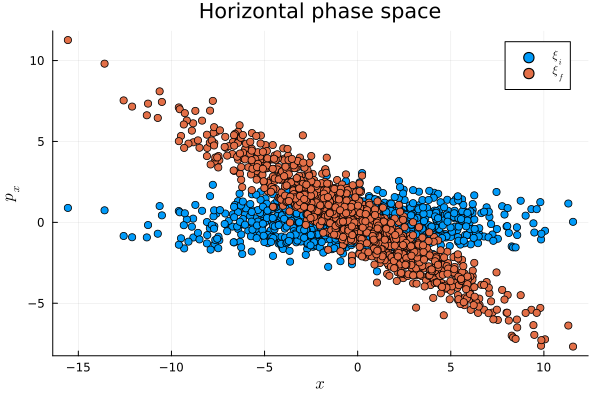

In [123]:
x_i = Γi[1,:]
px_i = Γi[2,:]

x_f = Γ_thinq[1,:]
px_f = Γ_thinq[2,:]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
plot!(x_f, px_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

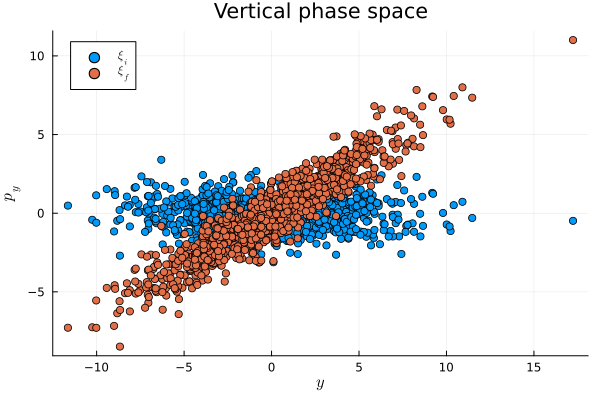

In [124]:
y_i = Γi[3,:]
py_i = Γi[4,:]

y_f = Γ_thinq[3,:]
py_f = Γ_thinq[4,:]

plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
plot!(y_f, py_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

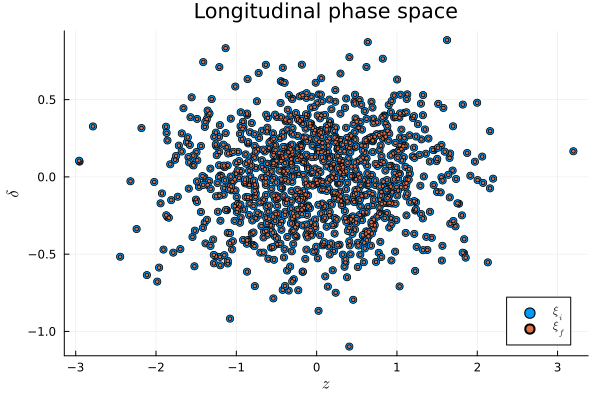

In [125]:
z_i = Γi[5,:]
δ_i = Γi[6,:]

z_f = Γ_thinq[5,:]
δ_f = Γ_thinq[6,:]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
plot!(z_f, δ_f, seriestype=:scatter, markersize=2, label=L"\xi_f")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

In [127]:

## TODO 
## evolve Γ using M_Fodo 

#....
### apply M...
#...

#Γf = ... ### final states

# solution from here 
N = length(Ms)

Γf = copy(Γi)

ξt = Matrix{Float64}(undef, 6, length(Ms))


for p in range(1,N_part)
    ξt = copy(Γi[:,p])
    for n in range(1,N)
        ξt = Ms[n](ξt)
    end
    Γf[:,p] = copy(ξt)
end



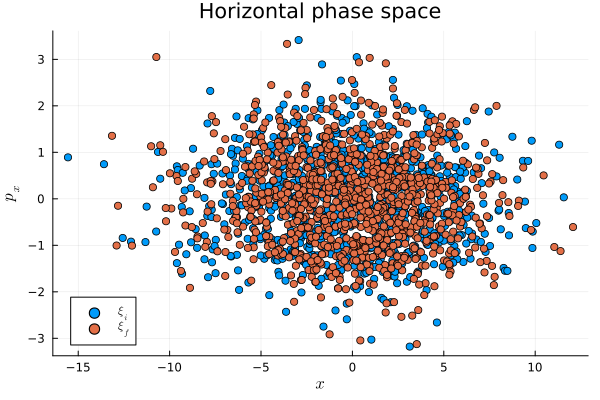

In [128]:
x_i = Γi[1,:]
px_i = Γi[2,:]

x_f = Γf[1,:]
px_f = Γf[2,:]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
plot!(x_f, px_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

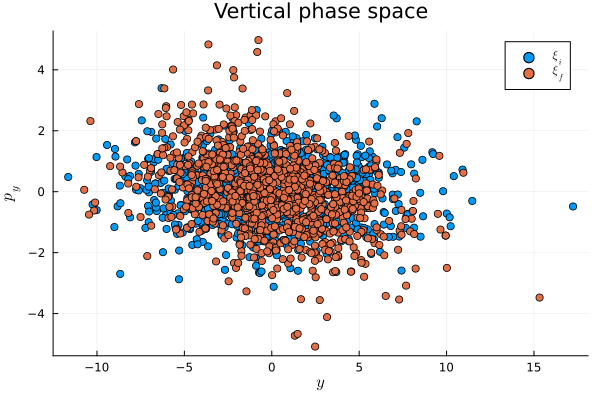

In [129]:
y_i = Γi[3,:]
py_i = Γi[4,:]

y_f = Γf[3,:]
py_f = Γf[4,:]

plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
plot!(y_f, py_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

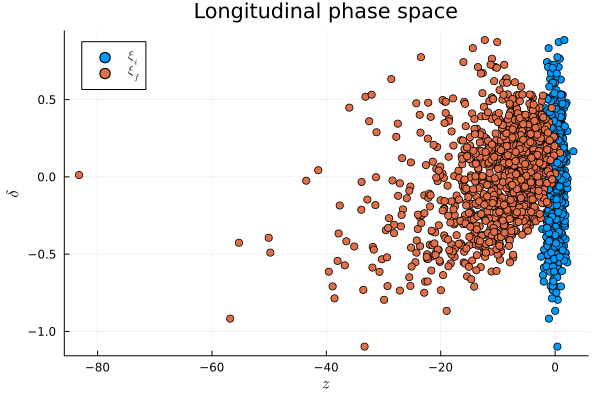

In [130]:
z_i = Γi[5,:]
δ_i = Γi[6,:]

z_f = Γf[5,:]
δ_f = Γf[6,:]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
plot!(z_f, δ_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

### Task 3.5

- [ ] Propagate the bunch through the fodo 4 more times and Plot the x-px plot for each further iteration

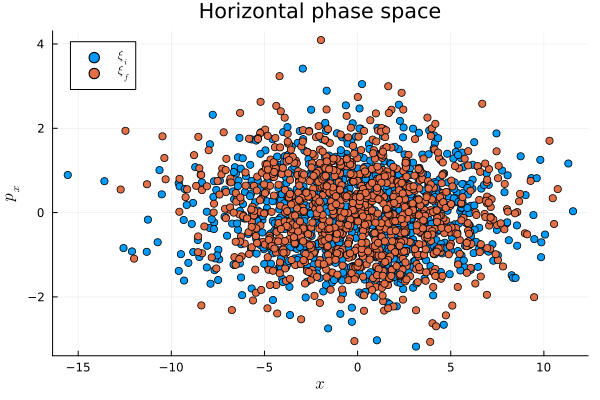

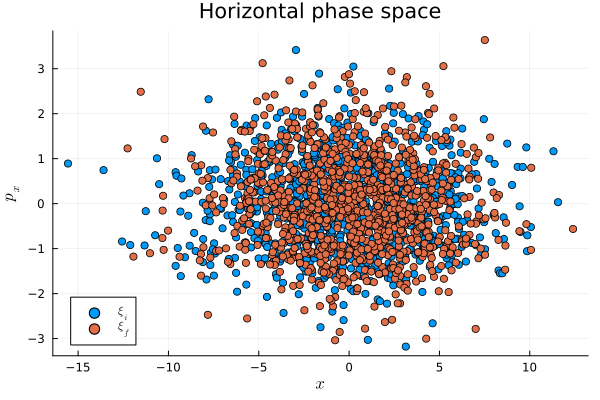

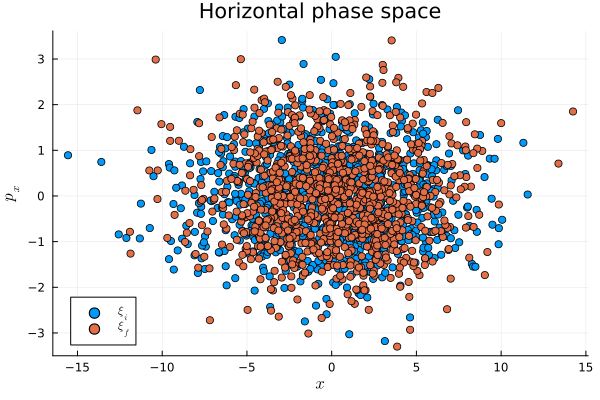

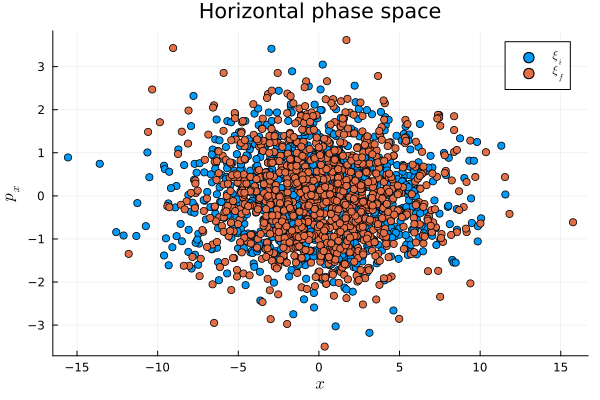

In [131]:
### Propagate 

# TODO

Γf2 = copy(Γf)

ξt = Matrix{Float64}(undef, 6, length(Ms))

for i in range(1,4)
    

    for p in range(1,N_part)
        ξt = copy(Γf2[:,p])
        for n in range(1,N)
            ξt = Ms[n](ξt)
        end
        Γf2[:,p] = copy(ξt)
    end
    
    x_i = Γi[1,:]
    px_i = Γi[2,:]
    
    x_f = Γf2[1,:]
    px_f = Γf2[2,:]
    
    plottt = plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
    plot!(plottt, x_f, px_f, seriestype=:scatter, label=L"\xi_f")
    xaxis!(L"x")
    yaxis!(L"p_x")
    title!("Horizontal phase space")
    
    display(plottt) 
end

### Task 2.6

- [ ] Calculate the eigenvalues and eigenvectors of the accumulated matrix

In [132]:
## TODO

In [133]:
m_ac = TaylorSeries.jacobian(Ms[1])
N = length(Ms)

for i in range(2,N)
    m_ac = TaylorSeries.jacobian(Ms[i]) * m_ac
end

eig = eigen(m_ac)




Eigen{ComplexF64, ComplexF64, Matrix{ComplexF64}, Vector{ComplexF64}}
values:
6-element Vector{ComplexF64}:
  0.909999769696703 - 0.41460875431175725im
  0.909999769696703 + 0.41460875431175725im
 0.9099997803032918 - 0.41460873103199464im
 0.9099997803032918 + 0.41460873103199464im
                1.0 + 0.0im
                1.0 + 0.0im
vectors:
6×6 Matrix{ComplexF64}:
         0.0-0.0im       …  0.0+0.0im          0.0+0.0im
         0.0-0.0im          0.0+0.0im          0.0+0.0im
    0.915809-0.0im          0.0+0.0im          0.0+0.0im
 1.61314e-16-0.401613im     0.0+0.0im          0.0+0.0im
         0.0-0.0im          1.0+0.0im         -1.0+0.0im
         0.0-0.0im       …  0.0+0.0im  4.15439e-17+0.0im

In [134]:
eig.values

6-element Vector{ComplexF64}:
  0.909999769696703 - 0.41460875431175725im
  0.909999769696703 + 0.41460875431175725im
 0.9099997803032918 - 0.41460873103199464im
 0.9099997803032918 + 0.41460873103199464im
                1.0 + 0.0im
                1.0 + 0.0im

In [135]:
eig.vectors

6×6 Matrix{ComplexF64}:
         0.0-0.0im       …  0.0+0.0im          0.0+0.0im
         0.0-0.0im          0.0+0.0im          0.0+0.0im
    0.915809-0.0im          0.0+0.0im          0.0+0.0im
 1.61314e-16-0.401613im     0.0+0.0im          0.0+0.0im
         0.0-0.0im          1.0+0.0im         -1.0+0.0im
         0.0-0.0im       …  0.0+0.0im  4.15439e-17+0.0im